<a href="https://colab.research.google.com/github/kailashnirola/python_notebooks/blob/main/ann_for_fancy_mnist.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import torch
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

#File uploading to notebook from local machile

In [5]:
from google.colab import files
files.upload()

Saving fmnist_small.csv to fmnist_small.csv


{'fmnist_small.csv': b'label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel120

#Dataset Loading

In [7]:
torch.random.manual_seed(42)
df = pd.read_csv('fmnist_small.csv')
df.head()

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,9,0,0,0,0,0,0,0,0,0,...,0,7,0,50,205,196,213,165,0,0
1,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,1,0,0,0,...,142,142,142,21,0,3,0,0,0,0
3,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,8,0,0,0,0,0,0,0,0,0,...,213,203,174,151,188,10,0,0,0,0


#Seperating features and labels

In [8]:
X = df.iloc[:, 1:]
y = df.iloc[:, 0]

In [9]:
X.shape, y.shape

((6000, 784), (6000,))

#Train test split

In [20]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify = y)

#Pandas Dataframes to Pytorch tensors

In [21]:
train_img = torch.tensor(x_train.values, dtype = torch.float32)
test_img = torch.tensor(x_test.values, dtype = torch.float32)
train_labels = torch.tensor(y_train.values, dtype = torch.long)
test_labels = torch.tensor(y_test.values, dtype = torch.long)

#Scaling

In [22]:
scaler = StandardScaler()
train_img = scaler.fit_transform(train_img)
test_img = scaler.transform(test_img)

#Create Custom Dataset

In [17]:
class CustomDataset(Dataset):
  def __init__(self, images, labels):
    self.features = torch.tensor(images, dtype = torch.float32)
    self.labels = torch.tensor(labels, dtype = torch.long)

  def __len__(self):
    return len(self.features)

  def __getitem__(self, idx):
    return self.features[idx], self.labels[idx]

#Creating Dataset Object

In [32]:
train_dataset = CustomDataset(train_img, train_labels)
test_dataset = CustomDataset(test_img, test_labels)

<ipython-input-17-6c65b00788c7>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.labels = torch.tensor(labels, dtype = torch.long)


#Train and Test Dataloader

In [33]:
train_loader = DataLoader(train_dataset, batch_size = 64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle = False)

#Neural Network Model

In [34]:
class MNISTModel(nn.Module):
  def __init__(self, input_size):
    super().__init__()
    self.network = nn.Sequential(
        nn.Linear(input_size, 128),
        nn.ReLU(),
        nn.Linear(128, 64),
        nn.ReLU(),
        nn.Linear(64, 10)
    )

  def forward(self, x):
    y_pred = self.network(x)
    return y_pred

#Defining Loss Function

In [35]:
loss_func = nn.CrossEntropyLoss()

#Important learning parameter

In [36]:
epochs = 100
learning_rate = 0.001

#Training a model

In [40]:
model = MNISTModel(train_dataset.features.shape[1])
optimizer = optim.Adam(model.parameters(), lr = learning_rate)

for epoch in range(epochs):
  total_loss = 0
  for images, target in train_loader:
    optimizer.zero_grad()
    pred = model(images)
    loss = loss_func(pred, target)
    loss.backward()
    optimizer.step()
    total_loss += loss.item()
  if epoch % 10 == 0 or epoch == 99:
    print(f"Epoch: {epoch + 1}, Loss: {total_loss/len(train_loader)}")

Epoch: 1, Loss: 0.9161783544222514
Epoch: 11, Loss: 0.1396119893590609
Epoch: 21, Loss: 0.03310549745336175
Epoch: 31, Loss: 0.03286688248626888
Epoch: 41, Loss: 0.0013407772787225743
Epoch: 51, Loss: 0.0006594399991445243
Epoch: 61, Loss: 0.00036983919747096174
Epoch: 71, Loss: 0.00022301483724731952
Epoch: 81, Loss: 0.00013604657656590764
Epoch: 91, Loss: 8.650538792911296e-05
Epoch: 100, Loss: 5.577185991569422e-05


In [30]:
model.eval()

MNISTModel(
  (network): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=64, bias=True)
    (3): ReLU()
    (4): Linear(in_features=64, out_features=10, bias=True)
  )
)

#Model Evaluation

In [42]:
total = 0
correct = 0

with torch.no_grad():
  for data, target in  test_loader:
    output = model(data)
    _, pred = torch.max(output.data, 1)
    total += target.size(0)
    correct += (pred == target).sum().item()
  print(f"Accuracy: {correct/total * 100: .4f}")

Accuracy:  86.2500


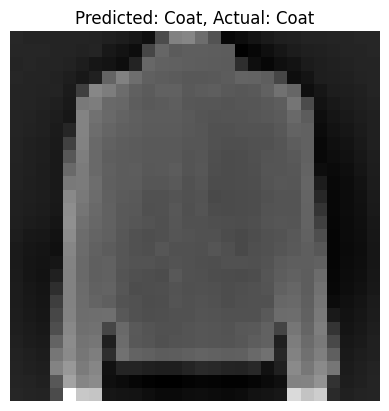

In [62]:
import matplotlib.pyplot as plt
import random

classes = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
           'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

data_iter = iter(test_loader)
images, labels = next(data_iter)

idx = random.randint(0, len(images)-1)
img = images[idx]
label = labels[idx]

img = img.reshape(28, 28)

with torch.no_grad():
    output = model(img.view(1, -1))
    _, pred = torch.max(output.data, 1)

plt.imshow(img, cmap='gray')
plt.title(f"Predicted: {classes[pred.item()]}, Actual: {classes[label.item()]}")
plt.axis('off')
plt.show()